In [24]:
import json
import os
import pandas as pd
import geopandas as gpd
import numpy as np
from shapely.geometry import Point
from shapely.geometry import LineString
from shapely.ops import unary_union
# contextily pas indispensable
import contextily as cx
import matplotlib.pyplot as plt
import folium
import datetime

ce notebook examine les données JSON récupérées par cozycloud dans le serveur e-mission pour l'utilisateur du cozy   
il faudrait aussi regarder les données JSON de déplacement produites par e-mission (et visualisées dans le Journal dans l'app)   
le format est diaryTrip   
cf. dans mes tests précédents   
 - affichage d'un trip du diary
 - import emission.net.api.timeline as timeline
 - import emission.core.wrapper.user as ecwu
 - import uuid
 - uuid1=ecwu.User.fromEmail('patgendre94@gmail.com').uuid
 - ret_geojson = timeline.get_trips_for_day(uuid1, '2019-07-24', True)
 - ce qui doit correspondre à https://github.com/e-mission/e-mission-server/blob/master/bin/debug/extract_trips_for_day_and_user.py
 - un autre script est https://github.com/e-mission/e-mission-server/blob/master/bin/debug/save_ground_truth.py
le script save_ground_truth fonctionne et crée un JSON contenant les déplacements d'un jour   
à ne pas confondre avec les données "timeline" qui sont toutes les données envoyées par l'appli au serveur dans usercache un jour J

In [25]:
from sklearn.cluster import DBSCAN
from geopy.distance import great_circle
from shapely.geometry import MultiPoint
from geopy import distance
#df = pd.read_csv('summer-travel-gps-full.csv')
#coords = df.as_matrix(columns=['lat', 'lon']) deprecated: à remplacer par .to_numpy

In [26]:

rep="../data/dataset_tracemob_1"
if not os.path.isdir(rep):
    print("Le répertoire "+rep+" n'existe pas.")


# Fonctions de lecture et transformation des données JSON cozy
## 1. lecture des données

In [27]:
def jsontrip(f):
    # returns a dict object from a cozy tracemob JSON file
    x=open(f).readlines()
    y=json.loads(x[0])['series'][0]
    jtrip={}
    jtrip['distance']=y['properties']['distance']
    jtrip['duration']=y['properties']['duration']
    jtrip['start_fmt_time']=y['properties']['start_fmt_time']
    jtrip['end_fmt_time']=y['properties']['end_fmt_time']
    jtrip['trip_id']=y['properties']['raw_trip']['$oid']
    if 'manual_mode' in y['properties']:
        jtrip['manual_mode']=y['properties']['manual_mode']
    if 'manual_purpose' in y['properties']:
        jtrip['manual_purpose']=y['properties']['manual_purpose']
    jtrip['points']=[]
    jtrip['timelines']=[]
    for j in y['features']:
        z={}
        if j['type']=="Feature":
            #point
            if j['properties']['feature_type'][-5:]=='place':
                z['lon']=j['geometry']['coordinates'][0]
                z['lat']=j['geometry']['coordinates'][1]
                z['type']='place'
            elif j['properties']['feature_type'][-4:]=='stop':
                lon1=j['geometry']['coordinates'][0][0]
                lat1=j['geometry']['coordinates'][0][1]
                lon2=j['geometry']['coordinates'][1][0]
                lat2=j['geometry']['coordinates'][1][1]
                z['lon']=0.5*(lon1+lon2)
                z['lat']=0.5*(lat1+lat2)
                z['type']='stop'
                # les stops points ont une entrée et une sortie (donc une extension, qu'on pourrait stocker aussi...)
            if 'enter_fmt_time' in j['properties']:
                z['enter_fmt_time']=j['properties']['enter_fmt_time']
            if 'exit_fmt_time' in j['properties']:
                z['exit_fmt_time']=j['properties']['exit_fmt_time']
            if 'display_name' in j['properties']:
                z['name']=j['properties']['display_name']
            jtrip['points'].append(z)
        elif j['type']=="FeatureCollection":
            if j['features'][0]['properties']['distance']>0:
                z['type']=j['features'][0]['properties']['feature_type']
                z['positions']=j['features'][0]['geometry']['coordinates']
                z['speeds']=j['features'][0]['properties']['speeds']
                z['distance']=j['features'][0]['properties']['distance']
                z['duration']=j['features'][0]['properties']['duration']
                z['end_fmt_time']=j['features'][0]['properties']['end_fmt_time']
                z['start_fmt_time']=j['features'][0]['properties']['start_fmt_time']
                z['sensed_mode']=j['features'][0]['properties']['sensed_mode']
                jtrip['timelines'].append(z)
            # TRIP AVEC N SECTIONS
            #linestring
    return jtrip

## 2. création d'objets points et lines à partir des traces

In [28]:
def get_points(rep):
    # takes the points (places, stops) of the cozy e-mission tracking data into a geodataframe
    t=[]
    for f in os.listdir(rep):
        if f[-4:]!="json":
            continue
        jt=jsontrip(rep+'/'+f)
        for x in jt['points']:
            t.append(x)
    df = pd.DataFrame(t)
    geometry = [Point(xy) for xy in zip(df.lon, df.lat)]
    points = gpd.GeoDataFrame(df, crs="EPSG:4326", geometry=geometry)
    # on complète l'objet le geodataframe points avec la durée de l'arrêt
    points=points.replace(np.nan,"")
    points.exit_fmt_time=pd.to_datetime(points.exit_fmt_time, utc=True)
    points.enter_fmt_time=pd.to_datetime(points.enter_fmt_time, utc=True)
    points["duration"]=0
    for i,p in points.iterrows():
        if pd.isnull(p.exit_fmt_time) or pd.isnull(p.enter_fmt_time):
            points['duration'].iloc[i]=0
            # ATTENTION : en fait la durée est très longue, si une des 2 valeurs exit ou enter time est absente
            #    souvent ce sera parce que le trajet est au début ou à la fin d'une journée
            #    et que l'utilisateur va rester la nuit dans la "place"
        else:
            points['duration'].iloc[i]=(p['exit_fmt_time']-p['enter_fmt_time']).total_seconds()/60.0
            # durée en minutes
    return points


In [29]:
def get_lines(rep):
    # takes the trajectories of the cozy e-mission tracking data into a geodataframe (one line for each trip section)
    t=[]
    for f in os.listdir(rep):
        if f[-4:]!="json":
            continue
        jt=jsontrip(rep+'/'+f)
        tl = {}
        tl['trip_id']=jt['trip_id']
        if len(jt['timelines'])>0:
            geom=unary_union([LineString([(xy[0],xy[1]) for xy in s['positions']]) for s in jt['timelines']])
            dist=sum([s['distance'] for s in jt['timelines']])
        tl['geometry']=geom
        tl['distance']=dist
        t.append(tl)
    df = pd.DataFrame(t)
    return gpd.GeoDataFrame(df, crs="EPSG:4326", geometry=df.geometry)


## 3 regroupement des points "fréquents"


pour aller plus loin il faudrait regrouper les points en "points fréquents"
 les algos de clustering spatial de postgis ne sont pas (encore) dispo dans geos et donc pas dans shapely
 Ex. ST_ClusterDBSCAN    
Mais on peut utiliser scikit-learn:
cf. https://geoffboeing.com/2014/08/clustering-to-reduce-spatial-data-set-size/

les lignes ci-dessous reprennent le tuto de Goeff Boeing avec mes données "points" tracemob exportés de cozy


In [16]:
def aggregate_points(points,return_p2fp:False):
    # in: a points geodataframe as returned by get_points
    # out : a frequent_points geodataframe
    coords = points[['lat', 'lon']].to_numpy()
    
    kms_per_radian = 6371.0088
    epsilon = 0.06 / kms_per_radian
    db = DBSCAN(eps=epsilon, min_samples=1, algorithm='ball_tree', metric='haversine').fit(np.radians(coords))
    cluster_labels = db.labels_
    num_clusters = len(set(cluster_labels))
    clusters = pd.Series([coords[cluster_labels == n] for n in range(num_clusters)])
    print('Number of clusters: {}'.format(num_clusters))
    
    def get_centermost_point(cluster):
        centroid = (MultiPoint(cluster).centroid.x, MultiPoint(cluster).centroid.y)
        dist = list(map(lambda point: great_circle(point, centroid).m, cluster))
        centermost_point = min(cluster, key=lambda point: great_circle(point, centroid).m)
        index_min = min(range(len(dist)), key=dist.__getitem__)
        # finalement on n'a pas besoin de index_min !
        # cf. https://stackoverflow.com/questions/2474015/getting-the-index-of-the-returned-max-or-min-item-using-max-min-on-a-list?answertab=votes#tab-top vote 559
        return tuple(centermost_point)
    centermost_points = clusters.map(get_centermost_point)
    
    # on récupère les attributs des points pour ajouter des attributs aux points fréquents
    # au départ le dict frequent_point_dict contient tous les points
    frequent_point_dict={}
    list_centermost_points=list(centermost_points)
    for i,p in points.iterrows():
        P=(p.lat,p.lon)
        if P not in list(centermost_points):
            continue
        ix=list_centermost_points.index(P)
        p_ix = [i for i, value in enumerate(cluster_labels) if value == ix]
        nb=len(clusters[ix])
        d=sum([points.duration[j] for j in p_ix])/nb
        frequent_point_dict[P]={"nom":p['name'],"duree_moy":d,"nb_arrets":nb,"lat":p['lat'],"lon":p['lon']}

    points_frequents = pd.DataFrame.from_dict(frequent_point_dict,orient='index')
    gpf = gpd.GeoDataFrame(
        points_frequents, geometry=gpd.points_from_xy(points_frequents.lon, points_frequents.lat), crs="EPSG:4326")
    #liste des tuples (lat,lon) points fréquents associés à chaque point
    if return_p2fp:
        p2fp=[list_centermost_points[cluster_labels[i]] for i,p in points.iterrows()]
        return gpf,p2fp
    else:
        return gpf

In [17]:
db

NameError: name 'db' is not defined

### commentaires
L'algo d'agrégation spatiale DBSCAN marche bien mais il faudrait peut-être distinguer les places et les stops   


## 4. création d'une table (dataframe) des trips (déplacements) et des sections (trajets)

In [30]:
def create_trips_sections (rep):
    # returns 2 dataframes from the cozy e-mission tracking data : for trips, and for sections
    trips=[]
    sections=[]
    for f in os.listdir(rep):
        if f[-4:]!="json":
            continue
        jt=jsontrip(rep+'/'+f)
        trip=[jt['trip_id'],jt['start_fmt_time'][:10],jt['distance'],jt['duration'],jt.get('manual_mode')]
        # je suis tombé sur un fichier json avec 2 sections seulement,
        #  mais 4 "points" : 2 places et 2 stops (pas normal en principe j'aurais dû alors trouver 3 sections)
        # on n'utilise pas les points du dict jt, seulement la liste des positions des timelines 
        #   le point de départ est le 1er point, le point d'arrivée est le dernier point
        tl=jt['timelines']
        modes=[]
        for s in range(len(tl)):
            points=tl[s]['positions']
            section=[tl[s]['start_fmt_time'][:10],tuple(points[0]),tuple(points[-1])]
            section.extend([tl[s]['distance'],tl[s]['duration'],tl[s]['sensed_mode'][19:]])
            # on saute le début du texte de la chaine sensed_mode qui est toujours "PredictedModeTypes."
            modes.append(tl[s]['sensed_mode'][19:])
            sections.append(section)
        start=tl[0]['positions'][0]
        stop=tl[len(tl)-1]['positions'][-1]
        trip.extend([modes,len(tl),tuple(start),tuple(stop)])
        trips.append(trip)
    trips = pd.DataFrame(trips,columns=['tripid','date','distance','duration','manual_mode','sensed_modes','nb_sections','start','end'])
    sections = pd.DataFrame(sections,columns=['date','start','end','distance','duration','sensed_mode'])
    return trips, sections

In [41]:
tuple_trip = create_trips_sections(rep)

tuple_trip

(                      tripid        date      distance     duration  \
 0   615a3c1ace6aa5fb6dcd79b4  2021-10-03   2900.182191   928.250079   
 1   6137ffa1c267f17f9c457b9c  2021-09-07   2447.162784   671.334023   
 2   61281f926d6d91afcc13c1e3  2021-08-13   1346.980130   363.622638   
 3   609db2604c8b3dc297b08c9e  2021-05-13    361.823886   395.902787   
 4   61491b4abecfcc27314123eb  2021-09-19   1603.069252   909.059007   
 ..                       ...         ...           ...          ...   
 57  60fb4e513f744a38718321a4  2021-07-22    543.882847  1225.492459   
 58  610dc18f96627a7184dbafb1  2021-08-05   1573.675582  1299.881383   
 59  613bf1403005cd10e3261feb  2021-09-09   1996.621670  1125.081544   
 60  61281f8b6d6d91afcc13c1b1  2021-08-10    883.254997   312.250320   
 61  61281f926d6d91afcc13c1e5  2021-08-13  97918.102941  4533.579897   
 
    manual_mode sensed_modes  nb_sections  \
 0         None  [BICYCLING]            1   
 1         None  [BICYCLING]            1   

In [40]:
import pandas as pd

pd.DataFrame(tuple_trip)

# .to_csv('../data/tracemob_trip_example.csv', index=False)

/home/sy/.local/lib/python3.8/site-packages/pandas/core/internals/construction.py:540: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  values = np.array([convert(v) for v in values])


,0
0,tripid date ...
1,date ...


In [ ]:
import csv

with open('../data/file.csv','wb') as out:
    csv_out=csv.writer(out)
    csv_out.writerow(['name','num'])
    for row in data:
        csv_out.writerow(row)

# Ex1. lecture d'un fichier JSON cozy

In [3]:

fn=""


La documentation des fichiers tracemob JSON cozy est ici 
https://github.com/fabmob/tracemob-phone/wiki/r%C3%A9cup%C3%A9ration-des-donn%C3%A9es-tracemob-d'un-utilisateur-sur-son-cozycloud-personnel
cozy récupère aussi les entrées manual/mode,purpose saisis par l'utilisateur


In [4]:
with open(fn) as f:
  y = json.load(f)

#y=json.loads(x[0])
# le JSON cozy est encapsulé dans une liste à un seul élément

In [ ]:
# series contient un trip e-mission (déplacement) et des objets features

In [5]:
print(y.keys())
# le JSON cozy contient des métadonnées et un conteneur "series" qui contient les données proprement dites

dict_keys(['_id', '_rev', 'captureDevice', 'cozyMetadata', 'endDate', 'series', 'source', 'startDate'])


In [21]:
print(y['endDate'], y['startDate'], y['captureDevice'])

2021-02-05T17:32:56.689000+01:00 2021-02-05T15:52:21.387416+01:00 Tests agremob patg


In [106]:
z=y['series']

In [37]:
z[0].keys()

dict_keys(['features', 'id', 'properties', 'type'])

In [4]:
#z[0]['properties']

In [3]:
# z[0]['features'][3]

In [ ]:
for f in os.listdir(rep):
    if f[-4:]!="json":
        continue
    jt=jsontrip(rep+'/'+fn)
    #print(jt['timeline']['type'])
# certains fichiers trips JSON ont 3 features (point de départ, arrivée + linestring) d'autres 5, 7 OU 9...
# dans tous les cas le dernier des 3,5,7,9 features est aussi un featurecollection, avec un seul objet: une section e-mission (trajet)
# on dirait que le fichier JSON contient tous les points du trip mais seulement le tracé d'une section

## exemple données du 10/03   
5 sections :   
f1="65b14f24c246d466e31c75a8eb76de1a.json"
f2="ddbf1ddf006b99b6f68fdd3dc64b30d2.json"
f3="ddbf1ddf006b99b6f68fdd3dc64b3c2f.json"
f4="ddbf1ddf006b99b6f68fdd3dc64b3e5e.json"
sur mes traces dans l'app le 10/03 je ne vois que 4 CLEANED_TRIPS 
de même dans mongodb
db.getCollection('Stage_analysis_timeseries').find({"metadata.key":"analysis/cleaned_trip",user_id:LUUID("6d6bf81c-5632-4a02-986f-83cb6420c852"),"data.end_fmt_time": {$regex:/2021-03-10/}},{"data.end_fmt_time":1});
-> Est-ce que cozy utilise les raw trips plutôt que les cleaned trips?
-> on voit que le 1er json a un autre nom 

In [7]:
# mes traces du 10/03/21
f1="65b14f24c246d466e31c75a8eb76de1a.json"
f2="ddbf1ddf006b99b6f68fdd3dc64b30d2.json"
f3="ddbf1ddf006b99b6f68fdd3dc64b3c2f.json"
f4="ddbf1ddf006b99b6f68fdd3dc64b3e5e.json"

In [8]:
t=[]
for f in [f1,f2,f3,f4]:
    print(f)
    j=jsontrip(rep+"/"+f)
    t.append(LineString([(xy[0],xy[1]) for xy in j['timelines'][0]['positions']]))
g=gpd.GeoDataFrame(pd.DataFrame(data={'geometry':t}), crs="EPSG:4326", geometry='geometry')

65b14f24c246d466e31c75a8eb76de1a.json
ddbf1ddf006b99b6f68fdd3dc64b30d2.json
ddbf1ddf006b99b6f68fdd3dc64b3c2f.json
ddbf1ddf006b99b6f68fdd3dc64b3e5e.json


In [36]:
g

,geometry
0,"LINESTRING (3.86826 43.62289, 3.86848 43.62305..."
1,"LINESTRING (3.87606 43.63299, 3.87611 43.63309..."
2,"LINESTRING (3.87589 43.63284, 3.87644 43.63361..."
3,"LINESTRING (3.86665 43.62636, 3.86700 43.62637..."


<AxesSubplot:>

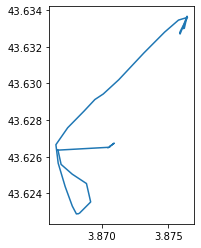

In [9]:
g.plot()

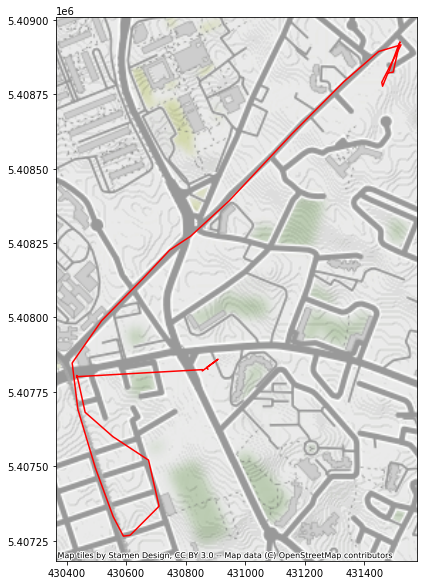

In [10]:
#geometry = [Point(xy) for xy in zip(df.lon, df.lat)]
ax = g.to_crs(epsg=3857).plot(figsize=(10, 10),color='red')
cx.add_basemap(ax, zoom=15)

## exemple du 11 mars 2021
un trip avec 2 sections d'après le journal sur l'app

In [11]:
t=[]
f="65b14f24c246d466e31c75a8eb76e0f1.json"
j=jsontrip(rep+"/"+f)
tl=j['timelines']
for s in tl:
    t.append(LineString([(xy[0],xy[1]) for xy in s['positions']]))
g=gpd.GeoDataFrame(pd.DataFrame(data={'geometry':t}), crs="EPSG:4326", geometry='geometry')

In [23]:
tl

[{'type': 'section',
  'positions': [[3.8903201, 43.6305354],
   [3.8903042557598035, 43.62995416087891],
   [3.8902096074397328, 43.62950958071884],
   [3.890091372349796, 43.62913051722413],
   [3.89004414187489, 43.62864347934874],
   [3.889972047574882, 43.62818952534899],
   [3.889915511774884, 43.62775720284865],
   [3.889815941386331, 43.62730108951884],
   [3.8902154863260554, 43.62714403947507],
   [3.89080699120183, 43.62722717200032],
   [3.891430189944669, 43.627384925406375],
   [3.892125332801812, 43.62763941112066],
   [3.892603433704433, 43.62782737696822],
   [3.893253888092071, 43.62819342940746],
   [3.893572328014025, 43.62837807641374],
   [3.8940099854356918, 43.62865044048352],
   [3.894505590276953, 43.628867921916324],
   [3.8948182756227028, 43.62894688881603],
   [3.895188760605607, 43.62896149185078],
   [3.8951788001831846, 43.628995785575704],
   [3.8948219869463063, 43.629122554323104],
   [3.8949016698391477, 43.62870246607457],
   [3.89520852473279, 43.

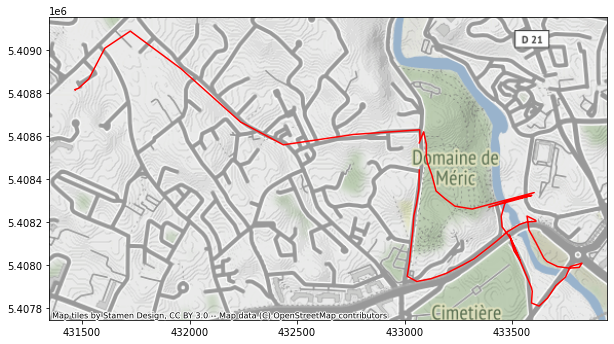

In [12]:
#geometry = [Point(xy) for xy in zip(df.lon, df.lat)]
ax = g.to_crs(epsg=3857).plot(figsize=(10, 10),color='red')
cx.add_basemap(ax, zoom=15)

## exemple avec manual_mode (saisi par l'utilisateur)

In [13]:
f="65b14f24c246d466e31c75a8eb72aa70.json"
j=jsontrip(rep+"/"+f)
j['manual_mode']

'bike'

# Ex2. Lecture de toutes les traces cozy (répertoire JSON zippé) et Affichage

In [15]:
rep="/home/patgendre/windows/Users/pmgen/Downloads/My Cozy/Data/io.cozy.timeseries.geojson"
if not os.path.isdir(rep):
	print("Le répertoire "+rep+" n'existe pas.")


In [16]:
points=get_points(rep)

/home/patgendre/miniconda3/envs/emission/lib/python3.7/site-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


In [17]:
lines=get_lines(rep)

In [19]:
lines.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [28]:
lines['L']=[g.length for g in lines.to_crs(epsg=2154).geometry]

In [21]:
len(lines.trip_id.unique())

704

In [29]:
lines['diffrel']=(lines['L'] - lines['distance'])/(0.5*(lines['L'] + lines['distance']))

In [9]:
points

,lon,lat,type,enter_fmt_time,exit_fmt_time,name,geometry,duration
0,3.877201,43.633994,place,2021-06-14 17:02:59.539000+00:00,2021-06-14 17:02:59.539000+00:00,"Rue du Pioch de Boutonnet, Montpellier",POINT (3.87720 43.63399),0.000000
1,3.880294,43.616087,place,2021-06-14 17:12:03+00:00,2021-06-14 17:15:59.676970+00:00,"Rue de la Cavalerie, Montpellier",POINT (3.88029 43.61609),236.676970
2,3.880483,43.616329,stop,2021-06-14 17:11:03+00:00,2021-06-14 17:11:18+00:00,,POINT (3.88048 43.61633),15.000000
3,3.866663,43.651319,place,2021-06-12 05:59:37+00:00,2021-06-12 06:13:21.686399+00:00,"Carrefour Agropolis, Hérault",POINT (3.86666 43.65132),824.686399
4,3.593541,43.684906,place,2021-06-12 07:25:50+00:00,2021-06-12 07:28:21.685449+00:00,", Hérault",POINT (3.59354 43.68491),151.685449
...,...,...,...,...,...,...,...,...
1879,3.876371,43.626511,place,2021-04-24 15:35:33+00:00,2021-04-24 15:37:53+00:00,"Avenue de la Justice de Castelnau, Montpellier",POINT (3.87637 43.62651),140.000000
1880,3.875948,43.633078,place,2021-04-24 15:43:46+00:00,2021-04-24 15:46:46+00:00,"Impasse Charles Dejean, Montpellier",POINT (3.87595 43.63308),180.000000
1881,3.875948,43.633078,place,2021-04-24 15:43:46+00:00,2021-04-24 15:46:46+00:00,"Impasse Charles Dejean, Montpellier",POINT (3.87595 43.63308),180.000000
1882,3.876076,43.633015,place,2021-04-24 16:44:35+00:00,NaT,"Impasse Charles Dejean, Montpellier",POINT (3.87608 43.63302),NaN


In [124]:
# finalement contextily n'apporte rien à folium pour afficher les cartes

In [123]:
# https://geopandas.readthedocs.io/en/latest/gallery/plotting_basemap_background.html
#ax = points.to_crs(epsg=3857).plot(figsize=(10, 10),color='red')
#cx.add_basemap(ax)

In [122]:
# https://geopandas.readthedocs.io/en/latest/gallery/plotting_basemap_background.html
#ax = lines.to_crs(epsg=3857).plot(figsize=(10, 10),color='purple')
#cx.add_basemap(ax)

In [18]:
m = folium.Map(location=points[['lat', 'lon']].mean().values.tolist(), control_scale=True)
sw = points[['lat','lon']].min().values.tolist()
ne = points[['lat','lon']].max().values.tolist()
m.fit_bounds([sw, ne]) 

fg = folium.FeatureGroup(name='tous les points tracemob', show=True)
m.add_child(fg)
for i in range(0, len(points)):
    folium.CircleMarker(location=[points['lat'].iloc[i], points['lon'].iloc[i]],
                        popup=points['name'][i],
                        radius=2,
                        color="darkred").add_to(fg)
    
gg = folium.FeatureGroup(name='tous les déplacements tracemob', show=True)
m.add_child(gg)
folium.Choropleth(lines['geometry'],line_weight=2,line_color='purple').add_to(gg)
folium.LayerControl().add_to(m)
display(m)

### regroupement des points proches
Ici on passe de 1800 à 550 environ, c'est peu, 
avec autorisation de clusters de 1 point et 50 mètres de distance pour le regroupement

In [23]:
gpf=aggregate_points(points)

Number of clusters: 551


In [24]:
gpf


,,nom,duree_moy,nb_arrets,lat,lon,geometry
43.616329,3.880483,,3.563052,9,43.616329,3.880483,POINT (3.88048 43.61633)
43.651319,3.866663,"Carrefour Agropolis, Hérault",6.763431,14,43.651319,3.866663,POINT (3.86666 43.65132)
43.684906,3.593541,", Hérault",2.528091,2,43.684906,3.593541,POINT (3.59354 43.68491)
43.654170,3.673710,,0.000000,1,43.654170,3.673710,POINT (3.67371 43.65417)
43.611153,3.880000,"Rue Fabre, Montpellier",30.722892,1,43.611153,3.880000,POINT (3.88000 43.61115)
...,...,...,...,...,...,...,...
43.647038,3.869086,,0.483333,1,43.647038,3.869086,POINT (3.86909 43.64704)
43.631346,3.878249,,0.000000,2,43.631346,3.878249,POINT (3.87825 43.63135)
43.912992,3.316591,"Route du Caylar à Nant, Aveyron",27.387168,2,43.912992,3.316591,POINT (3.31659 43.91299)
43.911538,3.318172,"Route du Caylar à Nant, Aveyron",3.000000,2,43.911538,3.318172,POINT (3.31817 43.91154)


In [27]:
m = folium.Map(location=[43.63, 3.89], zoom_start=13, control_scale=True)
fg = folium.FeatureGroup(name='tous les points tracemob', show=True)
m.add_child(fg)
gg = folium.FeatureGroup(name='les points regroupés en points fréquents', show=False)
m.add_child(gg)
#folium.Choropleth(gpf, fillcolor='red', line_weight=2).add_to(m)
#folium.Choropleth(points, line_color='green', line_weight=2).add_to(m)
# on remplace les icones par des points
#for i in range(0, len(gpf)):
#    folium.Marker(
#                [gpf['lat'].iloc[i], gpf['lon'].iloc[i]], 
#                icon=folium.Icon(color='orange',icon="home", prefix='fa')).add_to(gg)
for i in range(0, len(gpf)):
    folium.CircleMarker(location=[gpf['lat'].iloc[i], gpf['lon'].iloc[i]],
                        popup=gpf['nom'].iloc[i]+"\nNombre de stops: "+str(gpf['nb_arrets'].iloc[i])+"\nDurée moyenne: "+str(gpf['duree_moy'].iloc[i]),
                        radius=3,
                        color="orange"
).add_to(gg)

for i in range(0, len(points)):
    folium.CircleMarker(location=[points['lat'].iloc[i], points['lon'].iloc[i]],
                        popup=points['name'][i],
                        radius=2,
                        color="darkred").add_to(fg)
folium.LayerControl().add_to(m)


display(m)

In [279]:


# MarkerCluster est un plugin https://python-visualization.github.io/folium/plugins.html#folium.plugins.MarkerCluster
# à regarder une autre fois : https://georgetsilva.github.io/posts/mapping-points-with-folium/

In [30]:
# les 10 arrêts les + fréquents
gpf.sort_values("nb_arrets",ascending=False).iloc[0:21]

,,nom,duree_moy,nb_arrets,lat,lon,geometry
43.633032,3.876047,"Impasse Charles Dejean, Montpellier",145.380934,456,43.633032,3.876047,POINT (3.87605 43.63303)
43.626114,3.887785,,15.196460,39,43.626114,3.887785,POINT (3.88778 43.62611)
43.627411,3.881709,"Rue de Montasinos, Montpellier",3.369191,37,43.627411,3.881709,POINT (3.88171 43.62741)
43.626515,3.870467,"Route de Mende, Montpellier",41.738197,26,43.626515,3.870467,POINT (3.87047 43.62652)
43.630174,3.885372,"Rue du Mas de Calenda, Montpellier",4.239554,24,43.630174,3.885372,POINT (3.88537 43.63017)
43.608919,3.882914,,95.931676,19,43.608919,3.882914,POINT (3.88291 43.60892)
45.068369,5.556687,,266.828501,18,45.068369,5.556687,POINT (5.55669 45.06837)
43.634469,3.873501,"Rue du Moulin de Gasconnet, Montpellier",0.091809,18,43.634469,3.873501,POINT (3.87350 43.63447)
43.626302,3.876435,"Avenue de la Justice de Castelnau, Montpellier",20.456721,17,43.626302,3.876435,POINT (3.87644 43.62630)
43.623127,7.102833,"Chemin du Vallon, Alpes-Maritimes",41.222308,17,43.623127,7.102833,POINT (7.10283 43.62313)


In [79]:
rep="/home/patgendre/windows/Users/pmgen/Downloads/My Cozy/Data/io.cozy.timeseries.geojson"
f="65b14f24c246d466e31c75a8eb76e0f1.json"
f1="65b14f24c246d466e31c75a8eb76de1a.json"
f2="ddbf1ddf006b99b6f68fdd3dc64b30d2.json"
f3="ddbf1ddf006b99b6f68fdd3dc64b3c2f.json"
f4="ddbf1ddf006b99b6f68fdd3dc64b3e5e.json"
f5="a99d7e566cf68f0eeb23eb79ea40cc8b.json"
j=jsontrip(rep+"/"+f)
j['start_fmt_time'][:10]

'2021-03-11'

In [46]:
gpf,p2fp=aggregate_points(points,return_p2fp=True)

Number of clusters: 551


# ajout du point fréquent correspondant à start et end des trips et des sections
[p2fp[i] for i,s in sections.iterrows()]
il faut regarder sections['start'] (et end), trouver ce point dans points puis
chercher l'entrée correspondante à cette ligne dans p2fp

In [52]:
points

,lon,lat,type,enter_fmt_time,exit_fmt_time,name,geometry,duration
0,3.877201,43.633994,place,2021-06-14 17:02:59.539000+00:00,2021-06-14 17:02:59.539000+00:00,"Rue du Pioch de Boutonnet, Montpellier",POINT (3.87720 43.63399),0.000000
1,3.880294,43.616087,place,2021-06-14 17:12:03+00:00,2021-06-14 17:15:59.676970+00:00,"Rue de la Cavalerie, Montpellier",POINT (3.88029 43.61609),3.944616
2,3.880483,43.616329,stop,2021-06-14 17:11:03+00:00,2021-06-14 17:11:18+00:00,,POINT (3.88048 43.61633),0.250000
3,3.866663,43.651319,place,2021-06-12 05:59:37+00:00,2021-06-12 06:13:21.686399+00:00,"Carrefour Agropolis, Hérault",POINT (3.86666 43.65132),13.744773
4,3.593541,43.684906,place,2021-06-12 07:25:50+00:00,2021-06-12 07:28:21.685449+00:00,", Hérault",POINT (3.59354 43.68491),2.528091
...,...,...,...,...,...,...,...,...
1879,3.876371,43.626511,place,2021-04-24 15:35:33+00:00,2021-04-24 15:37:53+00:00,"Avenue de la Justice de Castelnau, Montpellier",POINT (3.87637 43.62651),2.333333
1880,3.875948,43.633078,place,2021-04-24 15:43:46+00:00,2021-04-24 15:46:46+00:00,"Impasse Charles Dejean, Montpellier",POINT (3.87595 43.63308),3.000000
1881,3.875948,43.633078,place,2021-04-24 15:43:46+00:00,2021-04-24 15:46:46+00:00,"Impasse Charles Dejean, Montpellier",POINT (3.87595 43.63308),3.000000
1882,3.876076,43.633015,place,2021-04-24 16:44:35+00:00,NaT,"Impasse Charles Dejean, Montpellier",POINT (3.87608 43.63302),0.000000


In [31]:
###calculs sur les déplacements (trips) et les trajets (sections)

In [32]:
trips,sections=create_trips_sections (rep)

In [33]:
s2=sections[['date','duration','distance','sensed_mode']].groupby(['sensed_mode','date']).sum()

In [34]:
s2.groupby('sensed_mode').mean()

,duration,distance
sensed_mode,,
AIR_OR_HSR,1701.018221,206917.873625
BICYCLING,3883.973125,15973.931774
BUS,674.393139,3941.165622
CAR,4032.872958,59508.458744
TRAIN,7668.890574,339232.539251
TRAM,476.695802,1551.895452
UNKNOWN,2025.647873,29747.871063
WALKING,3913.956369,3356.777343


In [37]:
def resume_cozy(trips,sections):
    # indicateurs résumant les données cozy
    duree=datetime.datetime.strptime(max(trips['date']),'%Y-%m-%d')- datetime.datetime.strptime(min(trips['date']),'%Y-%m-%d')
    duree=duree.days
    print("durée en jours: "+str(duree))
    nbj=len(trips['date'].unique())
    print("nb de jours avec des données: "+str(nbj))
    sections['distance']=sections['distance']/1000.0
    sections['duration']=sections['duration']/60.0
    sbydayandmode=sections[['date','duration','distance','sensed_mode']].groupby(['sensed_mode','date']).sum()
    print("distances quotidiennes moyennes en km et durées quotidiennes moyennes par mode")
    print('pour les jours où le mode est emprunté')
    print(sections.groupby('sensed_mode').mean())

In [38]:
resume_cozy(trips,sections)

durée en jours: 174
nb de jours avec des données: 158
distances quotidiennes moyennes en km et durées quotidiennes moyennes par mode
pour les jours où le mode est emprunté
             distance  duration
sensed_mode                    
AIR_OR_HSR   0.206918  0.472505
BICYCLING    0.006550  0.442387
BUS          0.003153  0.149865
CAR          0.022828  0.429732
TRAIN        0.135693  0.852099
TRAM         0.001293  0.110346
UNKNOWN      0.029748  0.562680
WALKING      0.000939  0.304146


In [40]:
sections

,date,start,end,distance,duration,sensed_mode
0,2021-06-14,"(3.8772011, 43.6339939)","(3.8804306, 43.6164415)",0.002189,0.134295,BICYCLING
1,2021-06-14,"(3.8805344, 43.6162173)","(3.8802937, 43.6160866)",0.000029,0.012500,WALKING
2,2021-06-12,"(3.8666628, 43.6513188)","(3.6737101, 43.6541702)",0.019417,0.897032,BICYCLING
3,2021-06-12,"(3.6737101, 43.6541702)","(3.5935411, 43.6849062)",0.008955,0.301944,CAR
4,2021-06-12,"(3.8799997, 43.6111526)","(3.8759351, 43.6328949)",0.002984,0.281864,BICYCLING
...,...,...,...,...,...,...
1052,2021-04-24,"(3.9341392, 43.656787)","(3.9339571, 43.6557779)",0.003552,0.808913,WALKING
1053,2021-04-24,"(3.9342763, 43.6567916)","(3.876371, 43.6265109)",0.010011,0.336618,CAR
1054,2021-04-24,"(3.876371, 43.6265109)","(3.8759484, 43.6330777)",0.001029,0.098056,CAR
1055,2021-04-24,"(3.8759484, 43.6330777)","(3.8747924, 43.6277119)",0.001161,0.845230,CAR


## Ex3 lecture d'un diarytrips

In [33]:
rep="/home/patgendre/windows/Users/pmgen/Documents/infomobi/essais/tracemob-json"
f=rep+"/"+"diarytrip130621.json"
x=json.load(open(f))

In [82]:
x=json.load(open(f))

In [85]:
y=x['data']

In [90]:
len(y)

7

In [36]:
l=diarytrip2dict(f)

In [35]:
# le format JSON exporté par e-mission diarytrips est très similaire au format JSON de cozy

In [34]:
def diarytrip2dict(f):
    # returns a list of dict object from an e-mission diarytrip JSON file
    # each dict is a trip as in jsontrip except that currently the trip doesn't include the manual info
    #  whereas it does in jsontrip when called for a cozy tracemob json file
    x=json.load(open(f))
    triplist=[]
    for y in x['data']:
        jtrip={}
        jtrip['distance']=y['properties']['distance']
        jtrip['duration']=y['properties']['duration']
        jtrip['start_fmt_time']=y['properties']['start_fmt_time']
        jtrip['end_fmt_time']=y['properties']['end_fmt_time']
        jtrip['trip_id']=y['properties']['raw_trip']['$oid']
        if 'manual_mode' in y['properties']:
            jtrip['manual_mode']=y['properties']['manual_mode']
        if 'manual_purpose' in y['properties']:
            jtrip['manual_purpose']=y['properties']['manual_purpose']
        jtrip['points']=[]
        jtrip['timelines']=[]
        for j in y['features']:
            z={}
            if j['type']=="Feature":
                #point
                if j['properties']['feature_type'][-5:]=='place':
                    z['lon']=j['geometry']['coordinates'][0]
                    z['lat']=j['geometry']['coordinates'][1]
                    z['type']='place'
                elif j['properties']['feature_type'][-4:]=='stop':
                    lon1=j['geometry']['coordinates'][0][0]
                    lat1=j['geometry']['coordinates'][0][1]
                    lon2=j['geometry']['coordinates'][1][0]
                    lat2=j['geometry']['coordinates'][1][1]
                    z['lon']=0.5*(lon1+lon2)
                    z['lat']=0.5*(lat1+lat2)
                    z['type']='stop'
                    # les stops points ont une entrée et une sortie (donc une extension, qu'on pourrait stocker aussi...)
                if 'enter_fmt_time' in j['properties']:
                    z['enter_fmt_time']=j['properties']['enter_fmt_time']
                if 'exit_fmt_time' in j['properties']:
                    z['exit_fmt_time']=j['properties']['exit_fmt_time']
                if 'display_name' in j['properties']:
                    z['name']=j['properties']['display_name']
                jtrip['points'].append(z)
            elif j['type']=="FeatureCollection":
                if j['features'][0]['properties']['distance']>0:
                    z['type']=j['features'][0]['properties']['feature_type']
                    z['positions']=j['features'][0]['geometry']['coordinates']
                    z['speeds']=j['features'][0]['properties']['speeds']
                    z['distance']=j['features'][0]['properties']['distance']
                    z['duration']=j['features'][0]['properties']['duration']
                    z['end_fmt_time']=j['features'][0]['properties']['end_fmt_time']
                    z['start_fmt_time']=j['features'][0]['properties']['start_fmt_time']
                    z['sensed_mode']=j['features'][0]['properties']['sensed_mode']
                    jtrip['timelines'].append(z)
                # TRIP AVEC N SECTIONS
                #linestring
        triplist.append(jtrip)
    return triplist